# import modules

In [ ]:
import glob, sys

sys.path.insert(0, "../")
from modules.contours_v2 import *
from modules.plot_utils import *

# super contour data

In [ ]:
filepath = "../data/..."
with open(filepath, "rb") as f:
    data = pickle.load(f)

In [12]:
data = get_super_contour_stats(data, thres_factor=1.01, thres_diff=0)
data

{0.016632: {0.1: {'contour': {'omega_matrix': array([[0. , 0.1, 0.2, ..., 2.8, 2.9, 3. ],
           [0. , 0.1, 0.2, ..., 2.8, 2.9, 3. ],
           [0. , 0.1, 0.2, ..., 2.8, 2.9, 3. ],
           ...,
           [0. , 0.1, 0.2, ..., 2.8, 2.9, 3. ],
           [0. , 0.1, 0.2, ..., 2.8, 2.9, 3. ],
           [0. , 0.1, 0.2, ..., 2.8, 2.9, 3. ]]),
    'theta_matrix': array([[0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.   ],
           [0.125, 0.125, 0.125, ..., 0.125, 0.125, 0.125],
           [0.25 , 0.25 , 0.25 , ..., 0.25 , 0.25 , 0.25 ],
           ...,
           [7.75 , 7.75 , 7.75 , ..., 7.75 , 7.75 , 7.75 ],
           [7.875, 7.875, 7.875, ..., 7.875, 7.875, 7.875],
           [8.   , 8.   , 8.   , ..., 8.   , 8.   , 8.   ]]),
    'epsilon_matrix': array([[0.0215496 , 0.0215496 , 0.0215496 , ..., 0.0215496 , 0.0215496 ,
            0.0215496 ],
           [0.0215358 , 0.02151706, 0.02149102, ..., 0.01983565, 0.01981908,
            0.01980857],
           [0.02152263, 0.02148586, 

In [13]:
with open("../data/super_contour_NP_L_mcz30_2024-06-24_05-13-18.pkl", "rb") as f:
    data_NP_L = pickle.load(f)

data_NP_L

{0.011418: {0.1: {'epsilon': 0.02516657186836857,
   'source_params': {'theta_S': 1.5707963267948966,
    'phi_S': 0.7853981633974483,
    'theta_J': 0.5235987755982988,
    'phi_J': 1.0471975511965976,
    'mcz': 0.00014778722279999997,
    'dist': 1.5439068750000003e+17,
    'eta': 0.25,
    't_c': 0.0,
    'phi_c': 0.0,
    'y': 0.34831069974900647,
    'MLz': 0.011338300361027181}},
  0.110256: {'epsilon': 0.027596085809720616,
   'source_params': {'theta_S': 1.5707963267948966,
    'phi_S': 0.7853981633974483,
    'theta_J': 0.5235987755982988,
    'phi_J': 1.0471975511965976,
    'mcz': 0.00014778722279999997,
    'dist': 1.5439068750000003e+17,
    'eta': 0.25,
    't_c': 0.0,
    'phi_c': 0.0,
    'y': 0.34831069974900647,
    'MLz': 0.011338300361027181}},
  0.120513: {'epsilon': 0.029985842207819746,
   'source_params': {'theta_S': 1.5707963267948966,
    'phi_S': 0.7853981633974483,
    'theta_J': 0.5235987755982988,
    'phi_J': 1.0471975511965976,
    'mcz': 0.000147787222

# super contours

In [14]:
td_arr = np.sort(np.array([k for k in data.keys()]))  # already rounded to 6 decimals
# I_arr = np.sort(data[td_arr[0]]["I_arr"])
I_arr = np.sort(np.array([round(I, 6) for I in data[td_arr[0]]["I_arr"]]))
X, Y = np.meshgrid(td_arr, I_arr)
src_params = data[td_arr[0]]["source_params"]

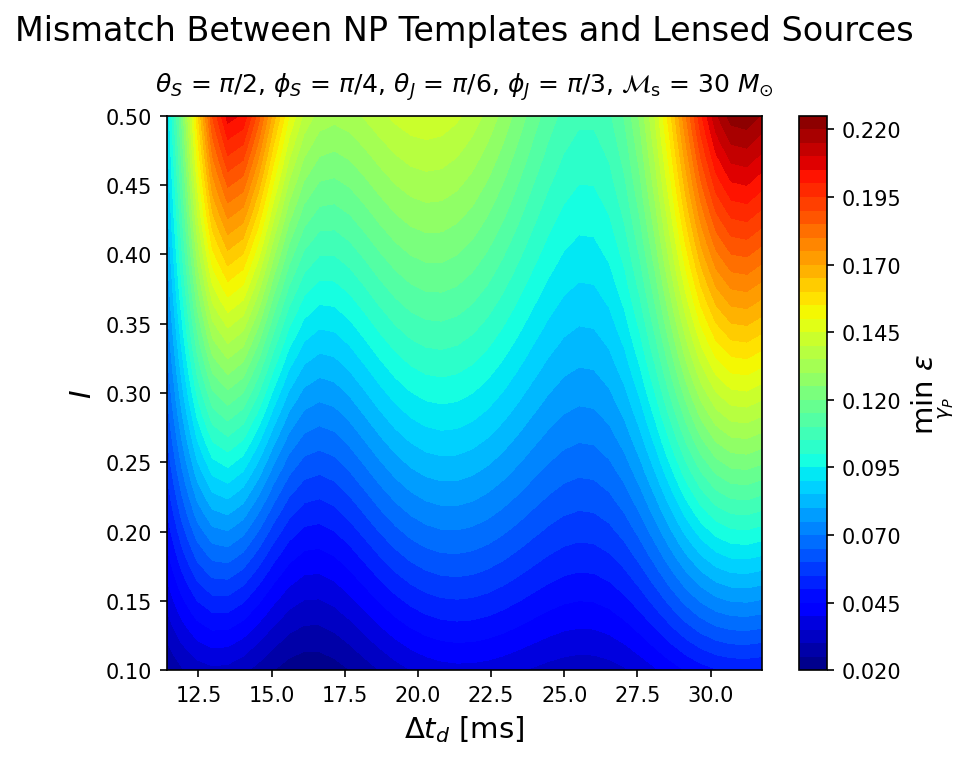

In [15]:
ep_NP_L_mtx = np.zeros_like(X)

for c, td in enumerate(td_arr):
    for r, I in enumerate(I_arr):
        ep_NP_L_mtx[r, c] = data_NP_L[td][I]["epsilon"]

plt.contourf(X * 1e3, Y, ep_NP_L_mtx, levels=40, cmap="jet")
plt.xlabel(r"$\Delta t_d$ [ms]", fontsize=14)
plt.ylabel(r"$I$", fontsize=14)
plt.colorbar(cmap="jet", norm=colors.Normalize(vmin=0, vmax=1)).set_label(
    label=r"$\min_{\gamma_P}$ $\epsilon$", size=14
)
plt.suptitle(
    "Mismatch Between NP Templates and Lensed Sources",
    fontsize=16,
    y=1.0215,
    x=0.435,
)

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\rm s}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
    ),
    fontsize=12,
    y=1.021,
)
plt.show()

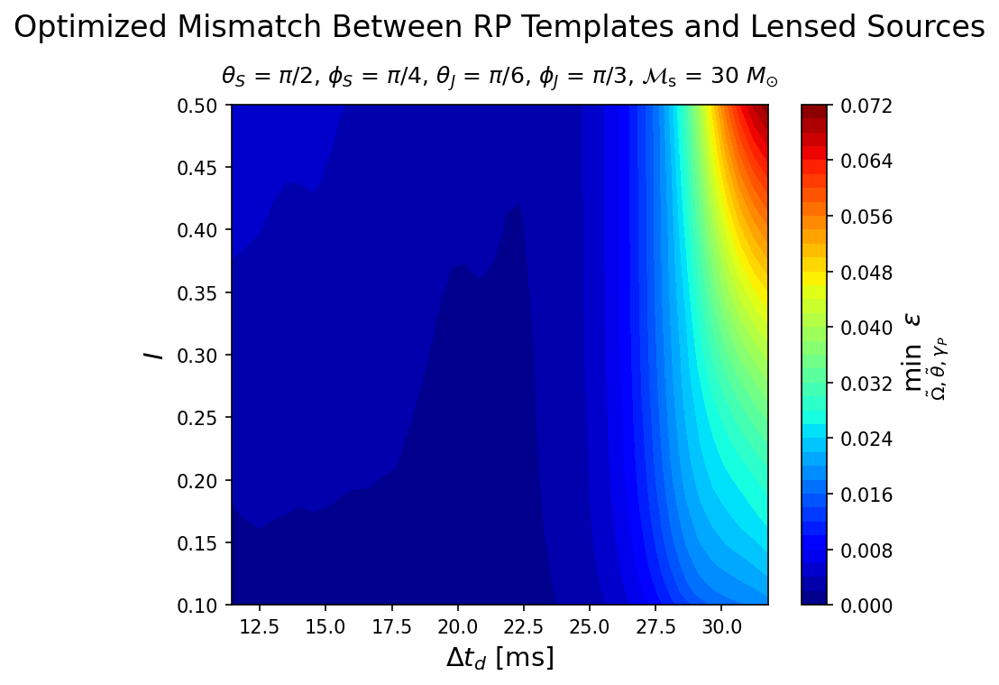

In [7]:
ep_min_mtx = np.zeros_like(X)

for c, td in enumerate(td_arr):
    for r, I in enumerate(I_arr):
        ep_min_mtx[r, c] = data[td][I]["stats"]["ep_min"]

plt.contourf(X * 1e3, Y, ep_min_mtx, levels=40, cmap="jet")
plt.xlabel(r"$\Delta t_d$ [ms]", fontsize=14)
plt.ylabel(r"$I$", fontsize=14)
plt.colorbar(cmap="jet", norm=colors.Normalize(vmin=0, vmax=1)).set_label(
    label=r"$\min_{\~\Omega, \~\theta, \gamma_P}$ $\epsilon$", size=14
)
plt.suptitle(
    "Optimized Mismatch Between RP Templates and Lensed Sources",
    fontsize=16,
    y=1.0215,
    x=0.435,
)

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\rm s}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
    ),
    fontsize=12,
    y=1.021,
)
plt.show()

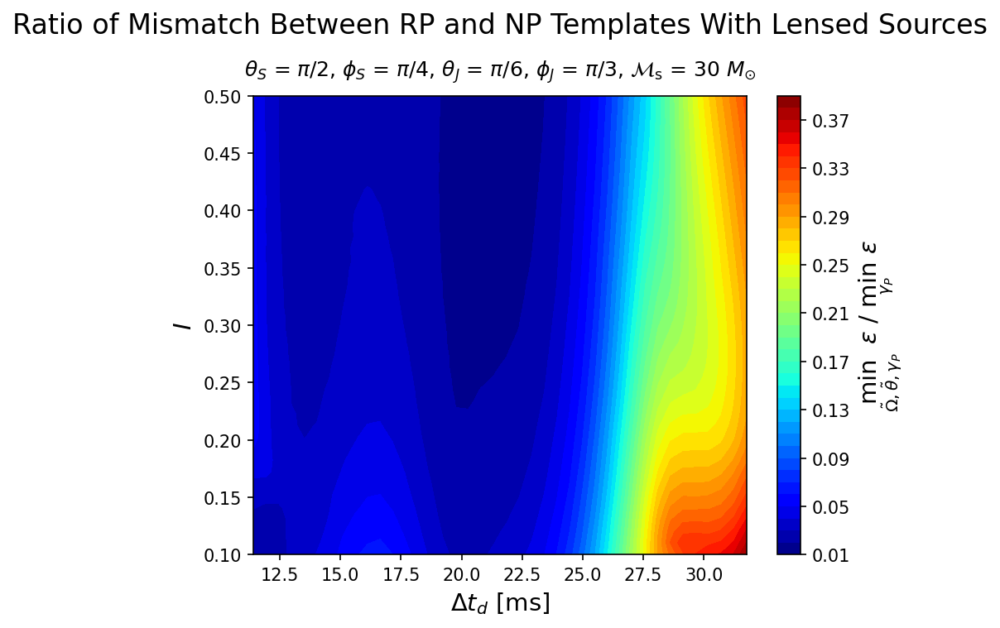

In [8]:
# create a contour that shows the ratio between the two above
ep_ratio_mtx = np.zeros_like(X)

for c, td in enumerate(td_arr):
    for r, I in enumerate(I_arr):
        ep_ratio_mtx[r, c] = ep_min_mtx[r, c] / ep_NP_L_mtx[r, c]

plt.contourf(X * 1e3, Y, ep_ratio_mtx, levels=40, cmap="jet")
plt.xlabel(r"$\Delta t_d$ [ms]", fontsize=14)
plt.ylabel(r"$I$", fontsize=14)
plt.colorbar(cmap="jet", norm=colors.Normalize(vmin=0, vmax=1)).set_label(
    label=r"$\min_{\~\Omega, \~\theta, \gamma_P}$ $\epsilon$ / $\min_{\gamma_P}$ $\epsilon$",
    size=14,
)
plt.suptitle(
    "Ratio of Mismatch Between RP and NP Templates With Lensed Sources",
    fontsize=16,
    y=1.0215,
    x=0.435,
)

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\rm s}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
    ),
    fontsize=12,
    y=1.021,
)
plt.show()

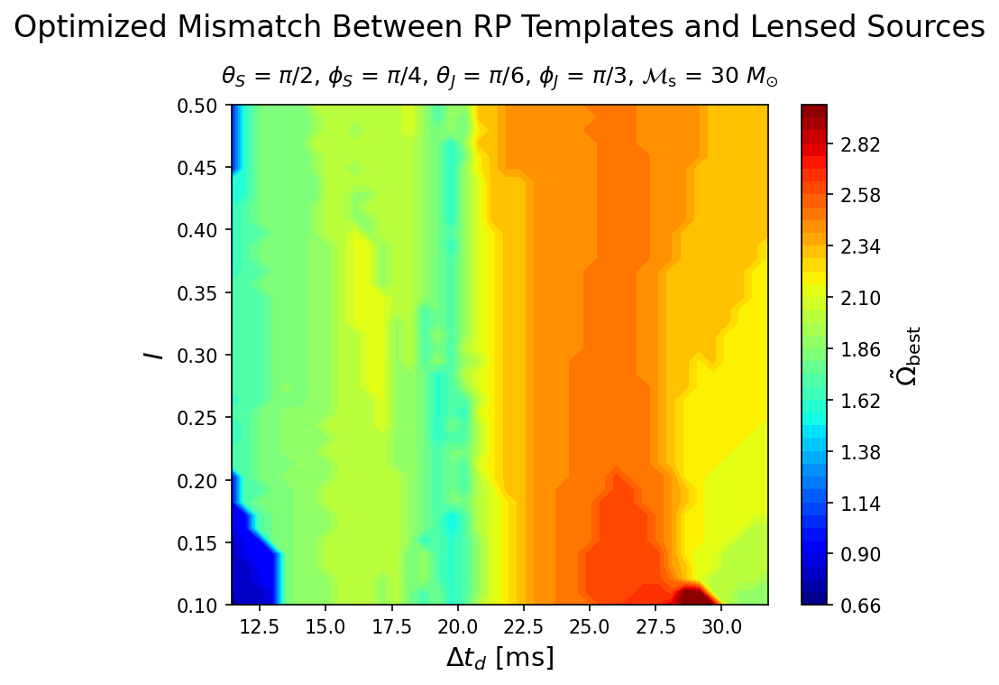

In [9]:
best_omega_mtx = np.zeros_like(X)

for c, td in enumerate(td_arr):
    for r, I in enumerate(I_arr):
        best_omega_mtx[r, c] = data[td][I]["stats"]["ep_min_omega_tilde"]

plt.contourf(X * 1e3, Y, best_omega_mtx, levels=40, cmap="jet")
plt.xlabel(r"$\Delta t_d$ [ms]", fontsize=14)
plt.ylabel(r"$I$", fontsize=14)
plt.colorbar(cmap="jet", norm=colors.Normalize(vmin=0, vmax=1)).set_label(
    label=r"$\~{\Omega}_{\rm best}$", size=14
)
plt.suptitle(
    "Optimized Mismatch Between RP Templates and Lensed Sources",
    fontsize=16,
    y=1.0215,
    x=0.435,
)

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\rm s}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
    ),
    fontsize=12,
    y=1.021,
)
plt.show()

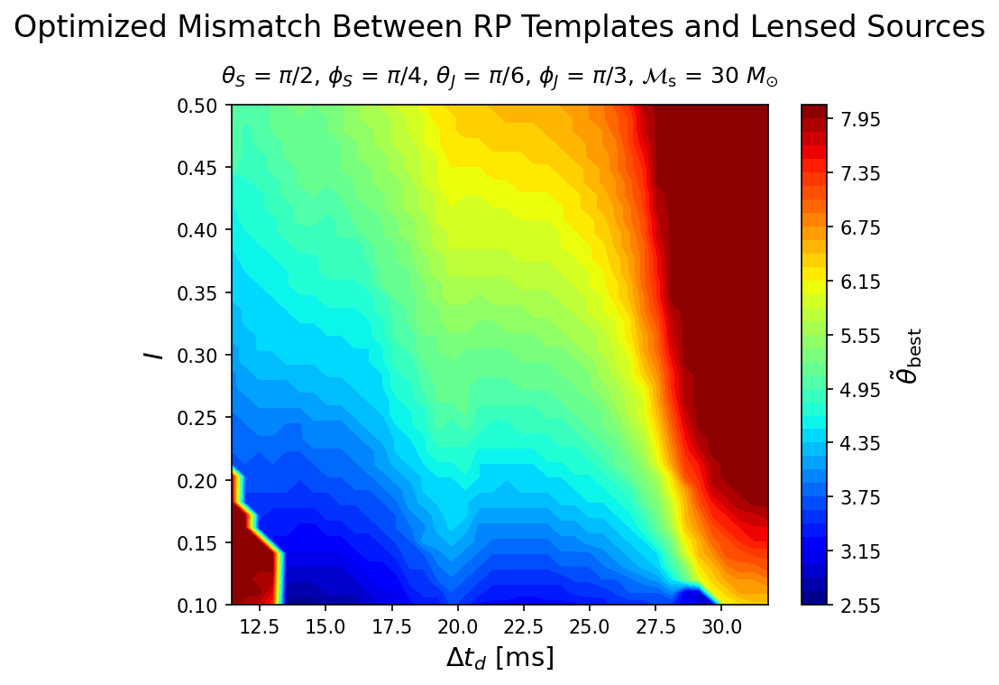

In [10]:
best_theta_mtx = np.zeros_like(X)

for c, td in enumerate(td_arr):
    for r, I in enumerate(I_arr):
        best_theta_mtx[r, c] = data[td][I]["stats"]["ep_min_theta_tilde"]

plt.contourf(X * 1e3, Y, best_theta_mtx, levels=40, cmap="jet")
plt.xlabel(r"$\Delta t_d$ [ms]", fontsize=14)
plt.ylabel(r"$I$", fontsize=14)
plt.colorbar(cmap="jet", norm=colors.Normalize(vmin=0, vmax=1)).set_label(
    label=r"$\~{\theta}_{\rm best}$", size=14
)
plt.suptitle(
    "Optimized Mismatch Between RP Templates and Lensed Sources",
    fontsize=16,
    y=1.0215,
    x=0.435,
)

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\rm s}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
    ),
    fontsize=12,
    y=1.021,
)
plt.show()

# as a function of $\Delta t_d$ while fixing $I$

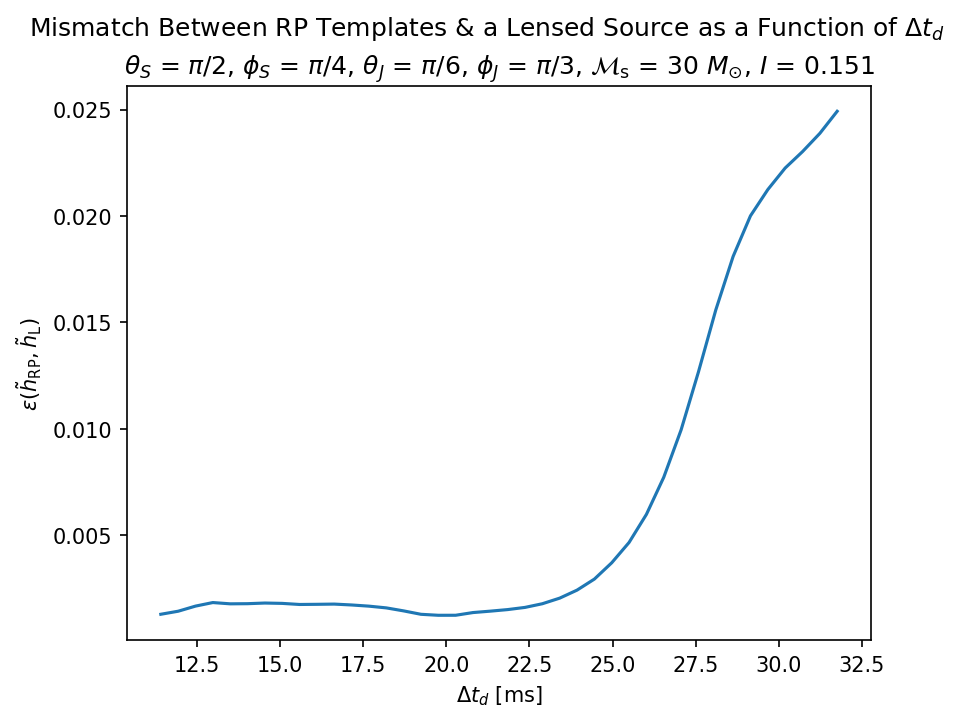

In [11]:
r = 5
td_ep_min_arr = ep_min_mtx[r, :]

plt.plot(td_arr * 1e3, td_ep_min_arr, label=r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")
plt.xlabel(r"$\Delta t_d$ [ms]")
plt.ylabel(r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}, $I$ = {:.3g}".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\text{s}}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        I_arr[r],
    )
)

plt.suptitle(
    r"Mismatch Between RP Templates & a Lensed Source as a Function of $\Delta t_d$"
)

plt.show()

In [12]:
td_best_omega_arr = best_omega_mtx[r, :]
omega_min_err_mtx = np.zeros_like(X)
omega_max_err_mtx = np.zeros_like(X)

for x, td in enumerate(td_arr):
    for y, I in enumerate(I_arr):
        omega_min_err_mtx[y, x] = np.min(data[td][I]["stats"]["omega_tilde_err"])
        omega_max_err_mtx[y, x] = np.max(data[td][I]["stats"]["omega_tilde_err"])

omega_err_arr = np.array(
    [
        td_best_omega_arr - omega_min_err_mtx[r, :],
        omega_max_err_mtx[r, :] - td_best_omega_arr,
    ]
)

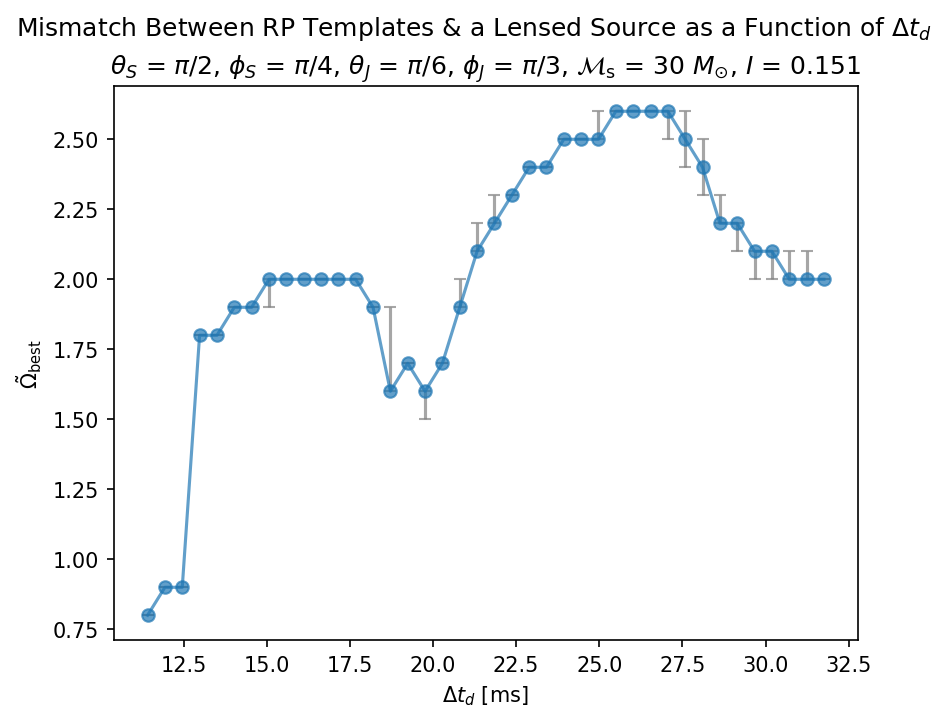

In [13]:
plt.errorbar(
    td_arr * 1e3,
    td_best_omega_arr,
    yerr=omega_err_arr,
    fmt="-o",
    label=r"$\~{\Omega}_{\rm best}$",
    capsize=3,
    ecolor="grey",
    alpha=0.7,
)
plt.xlabel(r"$\Delta t_d$ [ms]")
plt.ylabel(r"$\~{\Omega}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}, $I$ = {:.3g}".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\text{s}}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        I_arr[r],
    )
)

plt.suptitle(
    r"Mismatch Between RP Templates & a Lensed Source as a Function of $\Delta t_d$"
)

plt.show()

In [14]:
td_best_theta_arr = best_theta_mtx[r, :]
theta_min_err_mtx = np.zeros_like(X)
theta_max_err_mtx = np.zeros_like(X)

for x, td in enumerate(td_arr):
    for y, I in enumerate(I_arr):
        theta_min_err_mtx[y, x] = np.min(data[td][I]["stats"]["theta_tilde_err"])
        theta_max_err_mtx[y, x] = np.max(data[td][I]["stats"]["theta_tilde_err"])

theta_err_arr = np.array(
    [
        td_best_theta_arr - theta_min_err_mtx[r, :],
        theta_max_err_mtx[r, :] - td_best_theta_arr,
    ]
)

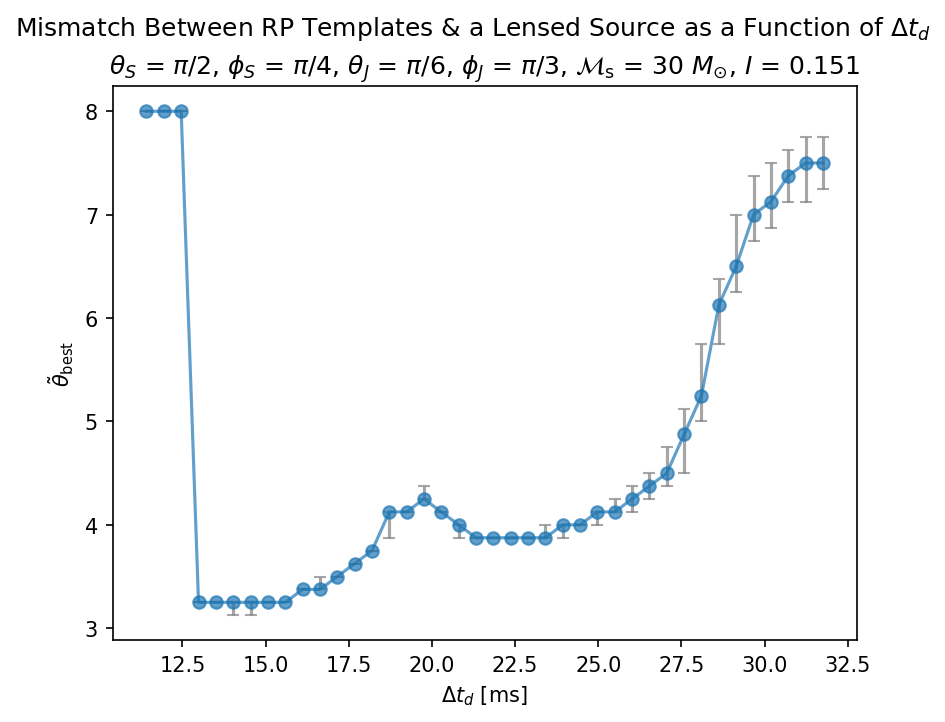

In [15]:
plt.errorbar(
    td_arr * 1e3,
    td_best_theta_arr,
    yerr=theta_err_arr,
    fmt="-o",
    label=r"$\~{\theta}_{\rm best}$",
    capsize=3,
    ecolor="grey",
    alpha=0.7,
)
plt.xlabel(r"$\Delta t_d$ [ms]")
plt.ylabel(r"$\~{\theta}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}, $I$ = {:.3g}".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\text{s}}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        I_arr[r],
    )
)

plt.suptitle(
    r"Mismatch Between RP Templates & a Lensed Source as a Function of $\Delta t_d$"
)

plt.show()

IntSlider(value=3, description='td index:', max=39)

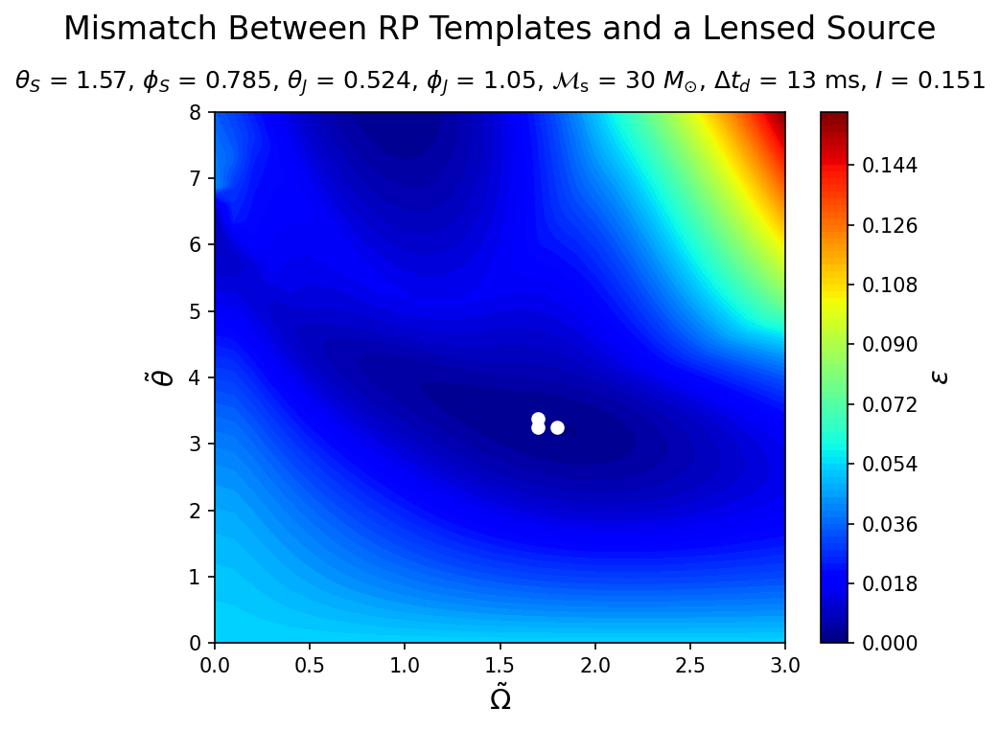

In [17]:
from IPython.display import clear_output

# Assuming td_arr and I_arr[r] are defined and have the same length
td_slider = ipywidgets.IntSlider(
    min=0, max=len(td_arr) - 1, step=1, value=0, description="td index:"
)
display(td_slider)


def update_plot(val):
    clear_output(wait=True)
    display(td_slider)
    td = td_arr[val["new"]]
    plot_indiv_contour_from_dict(data[td], I_arr[r])


td_slider.observe(update_plot, names="value")

# as a function of $I$ while fixing $\Delta t_d$

In [32]:
c = 2
data_I = data[td_arr[c]]

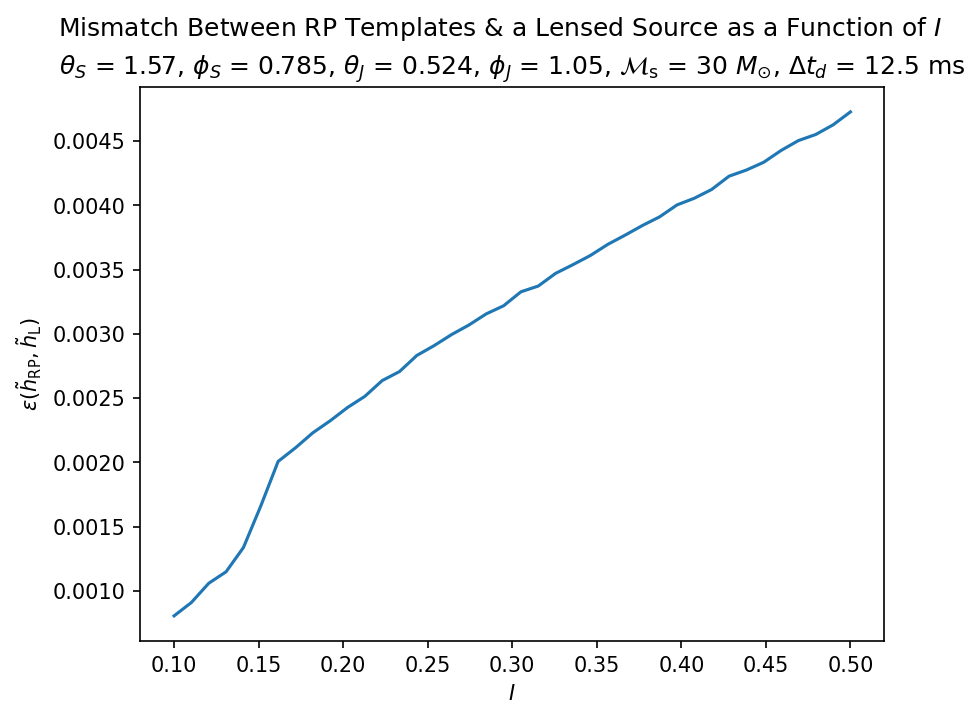

In [33]:
I_ep_min_arr = np.array([data_I[I]["stats"]["ep_min"] for I in I_arr])

plt.plot(I_arr, I_ep_min_arr, label=r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")
plt.xlabel(r"$I$")
plt.ylabel(r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}, $\Delta t_d$ = {:.3g} ms".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\text{s}}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_I["td"] * 1e3,
    )
)

plt.suptitle(r"Mismatch Between RP Templates & a Lensed Source as a Function of $I$")

plt.show()

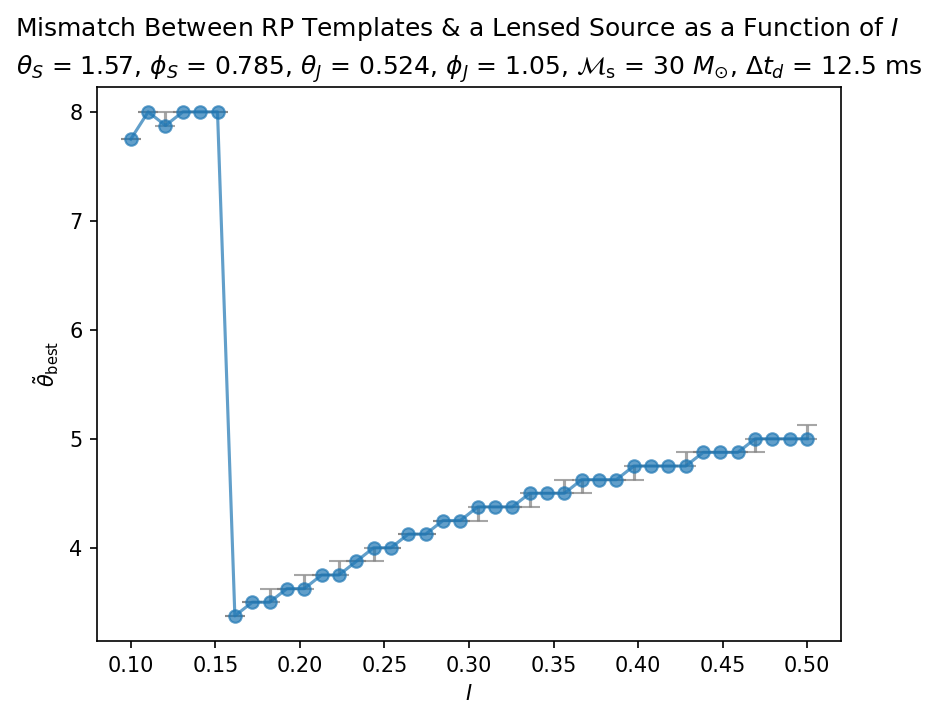

In [34]:
I_best_theta_arr = np.array([data_I[I]["stats"]["ep_min_theta_tilde"] for I in I_arr])

plt.errorbar(
    I_arr,
    I_best_theta_arr,
    yerr=get_asym_err(data_I, I_arr, "theta_tilde"),
    fmt="-o",
    label=r"$\~{\theta}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)

plt.xlabel(r"$I$")
plt.ylabel(r"$\~{\theta}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}, $\Delta t_d$ = {:.3g} ms".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\text{s}}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_I["td"] * 1e3,
    )
)

plt.suptitle(r"Mismatch Between RP Templates & a Lensed Source as a Function of $I$")

plt.show()

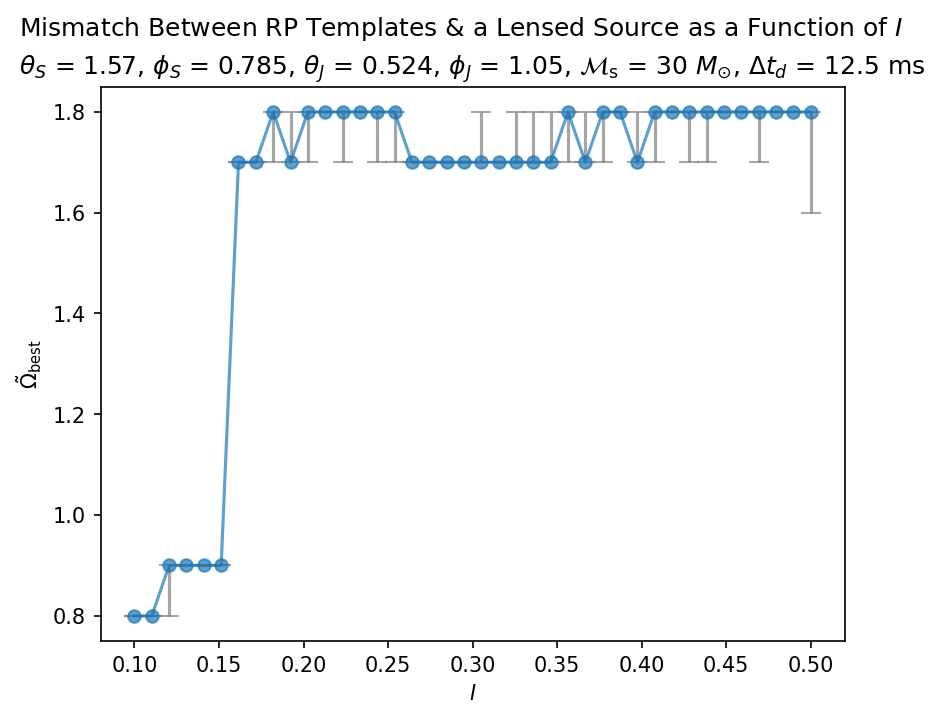

In [35]:
I_best_omega_arr = np.array([data_I[I]["stats"]["ep_min_omega_tilde"] for I in I_arr])

plt.errorbar(
    I_arr,
    I_best_omega_arr,
    yerr=get_asym_err(data_I, I_arr, "omega_tilde"),
    fmt="-o",
    label=r"$\~{\Omega}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)

plt.xlabel(r"$I$")
plt.ylabel(r"$\~{\Omega}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {}, $\phi_S$ = {}, $\theta_J$ = {}, $\phi_J$ = {}, {} = {:.3g} {}, $\Delta t_d$ = {:.3g} ms".format(
        angle_in_pi_format(src_params["theta_S"]),
        angle_in_pi_format(src_params["phi_S"]),
        angle_in_pi_format(src_params["theta_J"]),
        angle_in_pi_format(src_params["phi_J"]),
        r"$\mathcal{M}_{\text{s}}$",
        src_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_I["td"] * 1e3,
    )
)

plt.suptitle(r"Mismatch Between RP Templates & a Lensed Source as a Function of $I$")

plt.show()

In [21]:
from IPython.display import clear_output

# Assuming td_arr and I_arr[r] are defined and have the same length
I_slider = ipywidgets.IntSlider(
    min=0, max=len(I_arr) - 1, step=1, value=0, description="I index:"
)
display(I_slider)


def update_plot(val):
    clear_output(wait=True)
    display(I_slider)
    I = I_arr[val["new"]]
    plot_indiv_contour_from_dict(data[td_arr[c]], I)  # type: ignore


I_slider.observe(update_plot, names="value")

IntSlider(value=0, description='I index:', max=39)

# waveform comparison

In [20]:
# make data_td like data_I but with td as the key
r = 5
I = I_arr[r]
data_td = {}
for td in td_arr:
    data_td[td] = data[td][I]

data_td["source_params"] = data[td_arr[0]]["source_params"]

idx = -9.26531e-11, phi = 1.1405e-08, both should be ~0 if get_updated_mismatch_results is True


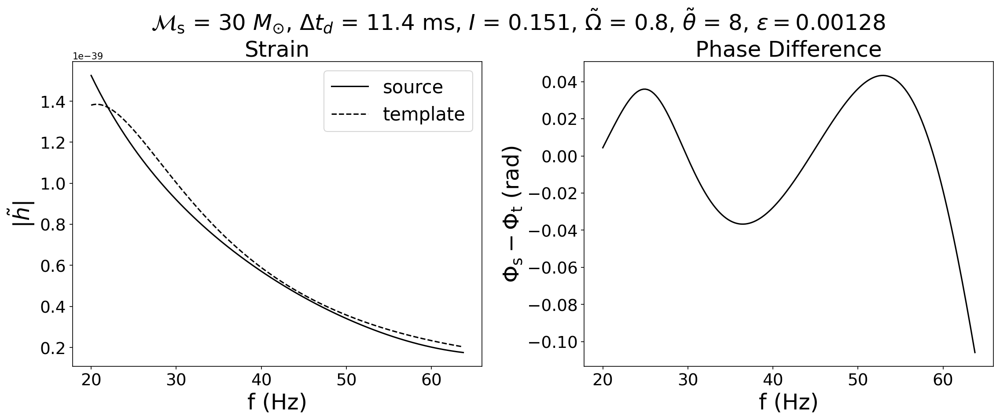

idx = -1.16879e-08, phi = 3.76355e-09, both should be ~0 if get_updated_mismatch_results is True


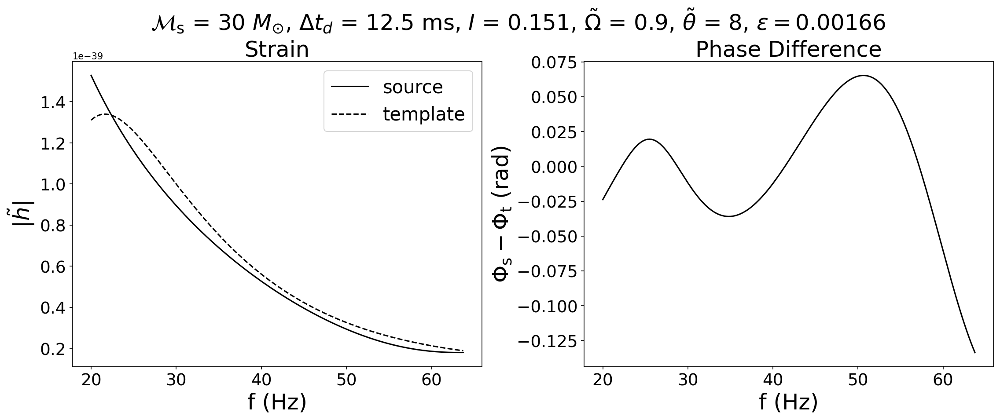

idx = -4.53888e-09, phi = 9.63414e-09, both should be ~0 if get_updated_mismatch_results is True


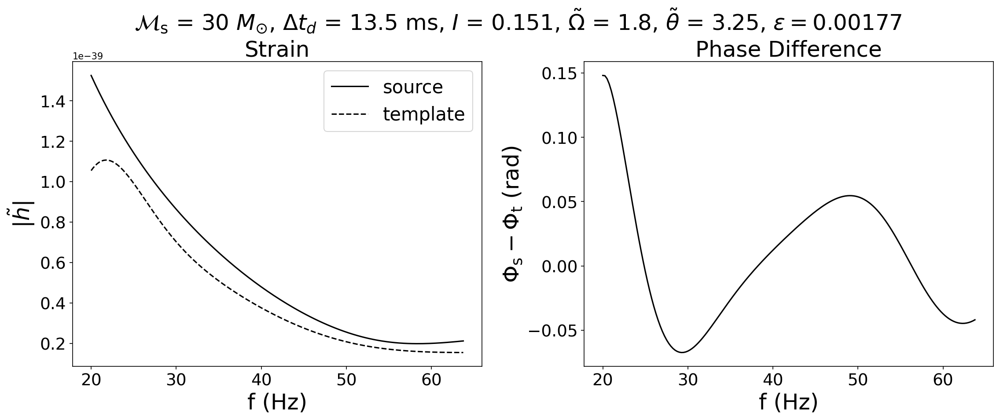

idx = -1.33475e-08, phi = -6.29994e-09, both should be ~0 if get_updated_mismatch_results is True


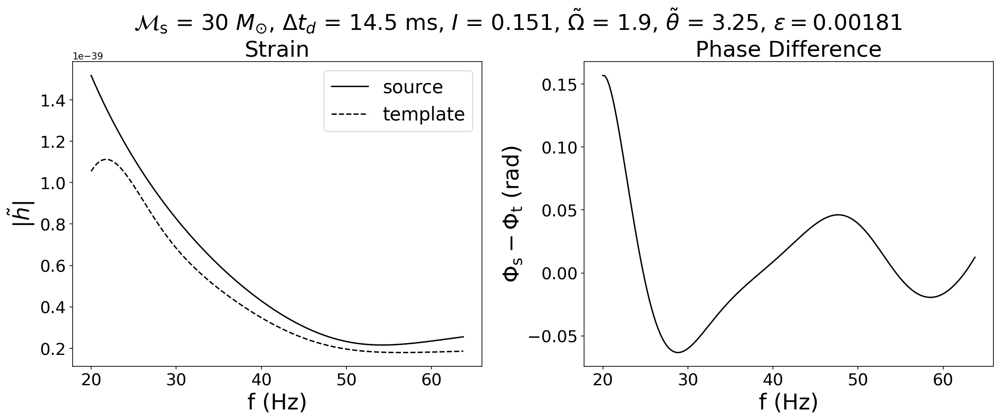

idx = -6.84638e-10, phi = 6.24589e-09, both should be ~0 if get_updated_mismatch_results is True


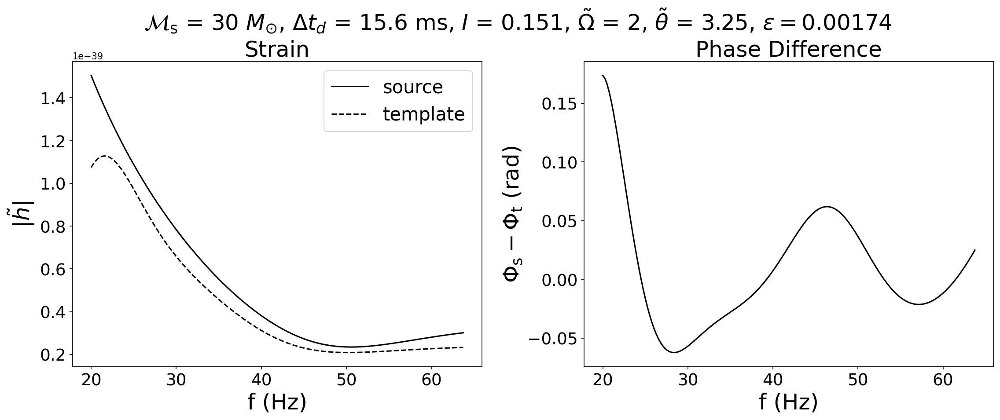

idx = -5.60728e-11, phi = -1.58874e-08, both should be ~0 if get_updated_mismatch_results is True


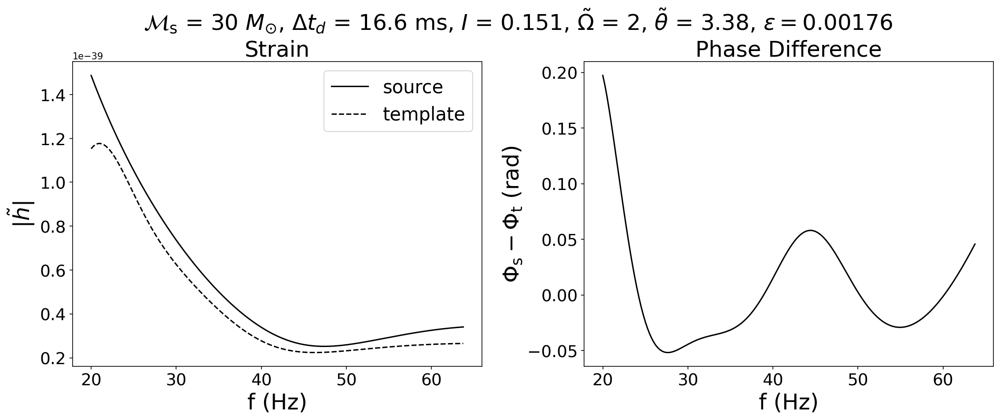

idx = 1.46744e-08, phi = 8.28059e-10, both should be ~0 if get_updated_mismatch_results is True


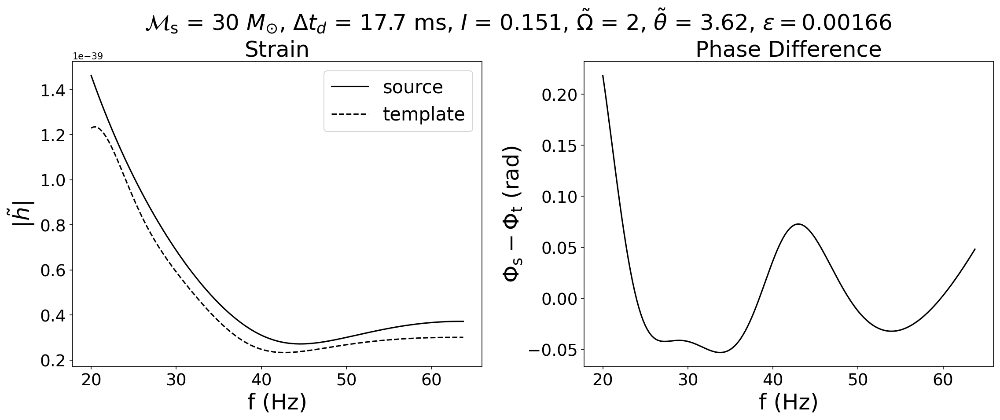

idx = 1.70284e-08, phi = 6.66682e-09, both should be ~0 if get_updated_mismatch_results is True


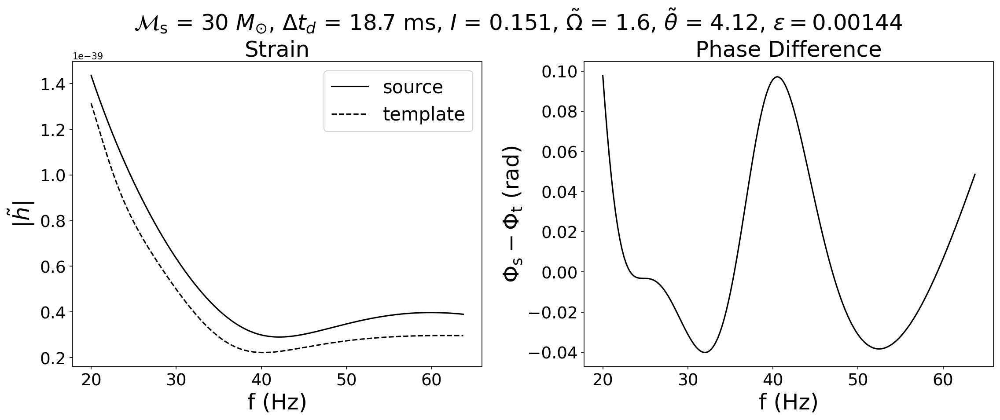

idx = -7.46946e-09, phi = 2.27231e-08, both should be ~0 if get_updated_mismatch_results is True


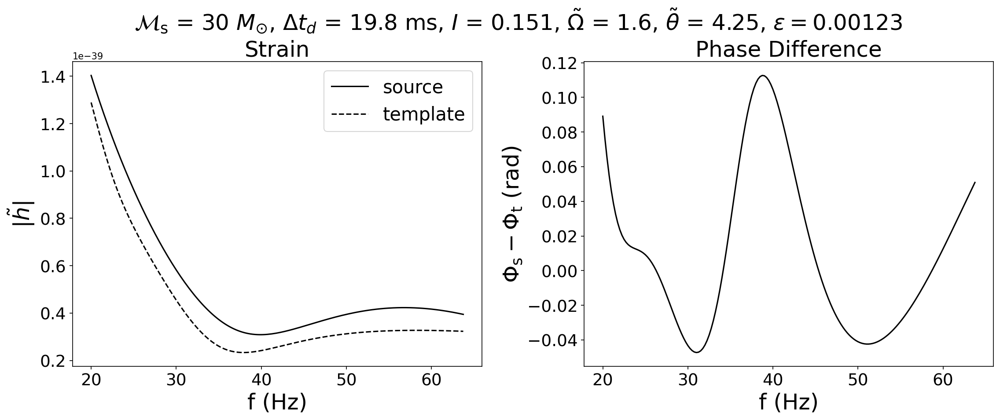

idx = -3.77301e-08, phi = 1.99514e-08, both should be ~0 if get_updated_mismatch_results is True


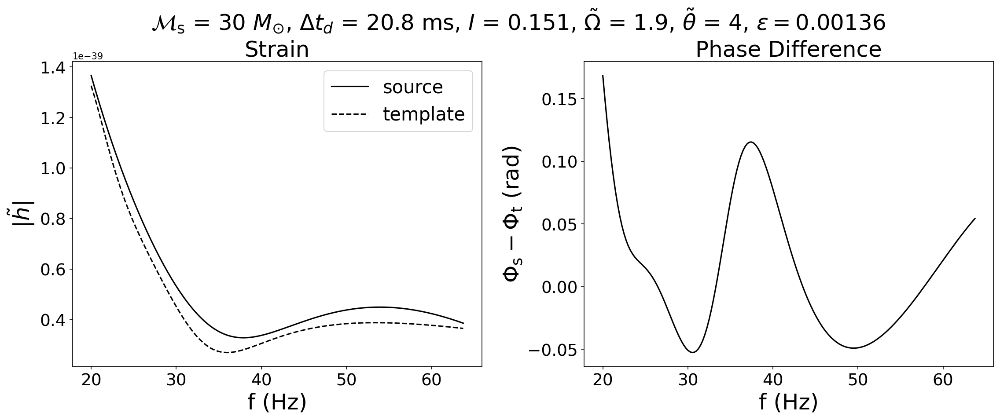

idx = 1.32763e-08, phi = -6.91211e-09, both should be ~0 if get_updated_mismatch_results is True


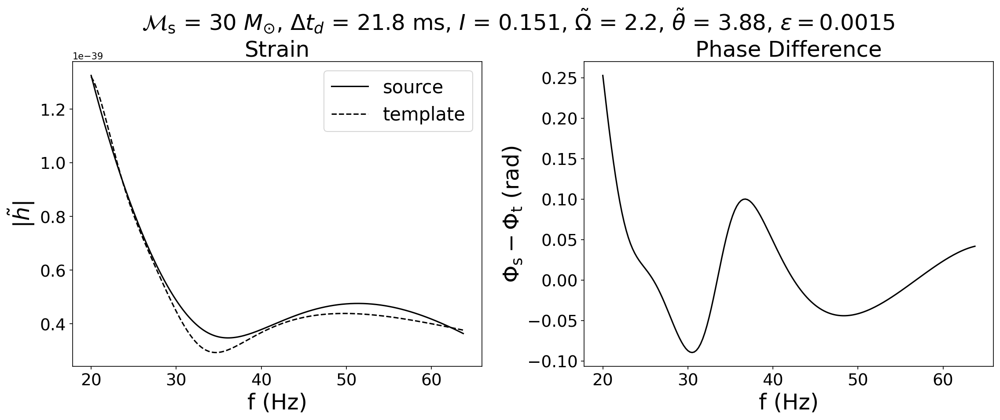

idx = -2.67453e-08, phi = -1.1363e-08, both should be ~0 if get_updated_mismatch_results is True


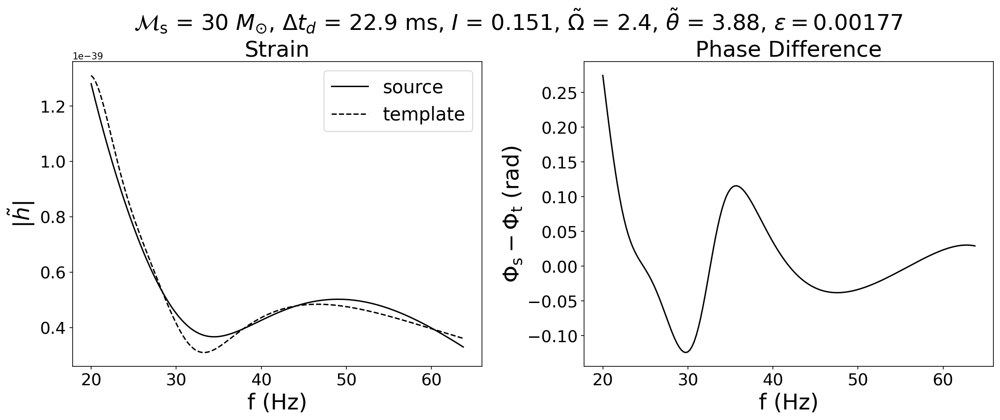

idx = 1.96471e-08, phi = 1.86031e-09, both should be ~0 if get_updated_mismatch_results is True


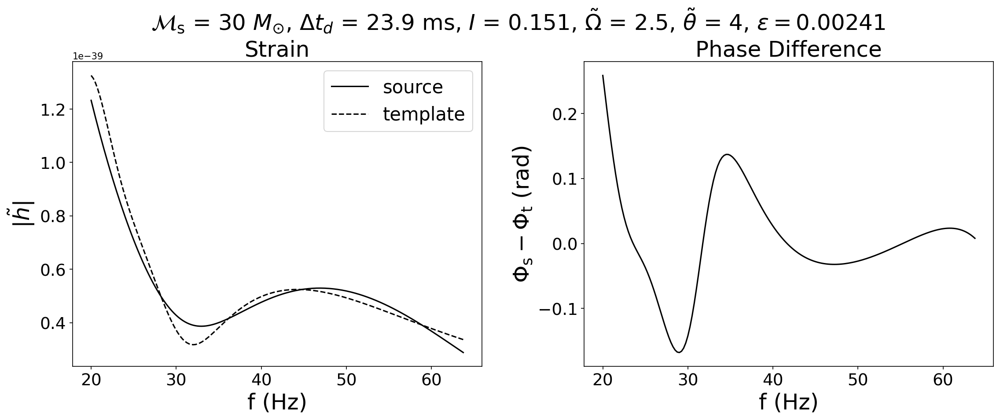

idx = -1.31471e-09, phi = 1.90076e-08, both should be ~0 if get_updated_mismatch_results is True


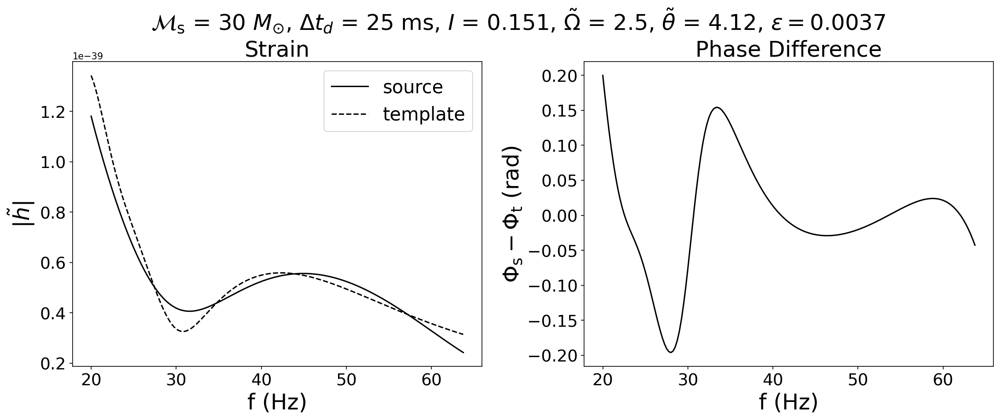

idx = -5.95434e-09, phi = -1.7058e-08, both should be ~0 if get_updated_mismatch_results is True


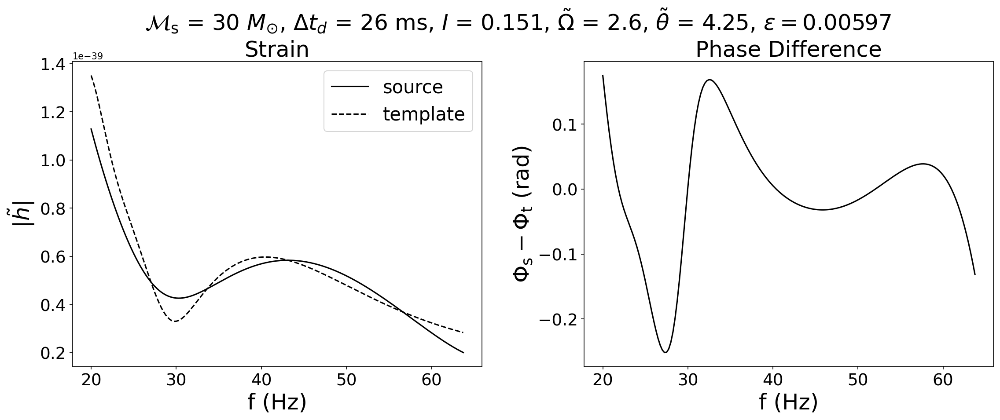

idx = -9.72712e-09, phi = -1.66875e-08, both should be ~0 if get_updated_mismatch_results is True


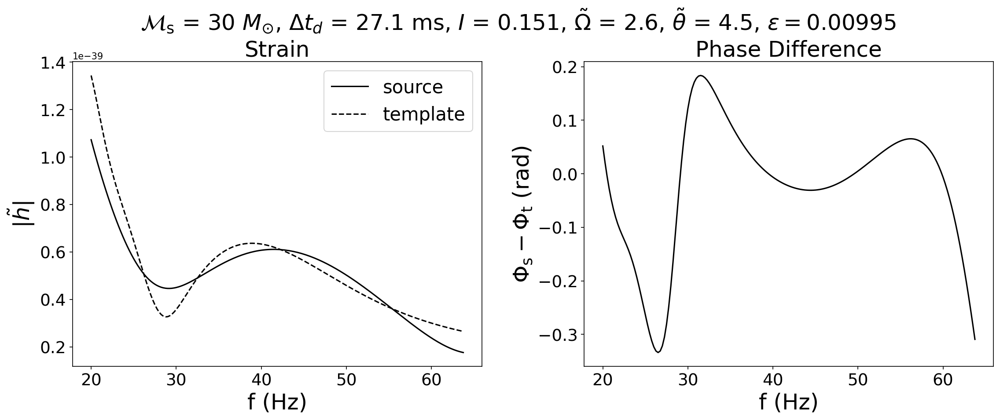

idx = -1.53222e-09, phi = 1.68619e-09, both should be ~0 if get_updated_mismatch_results is True


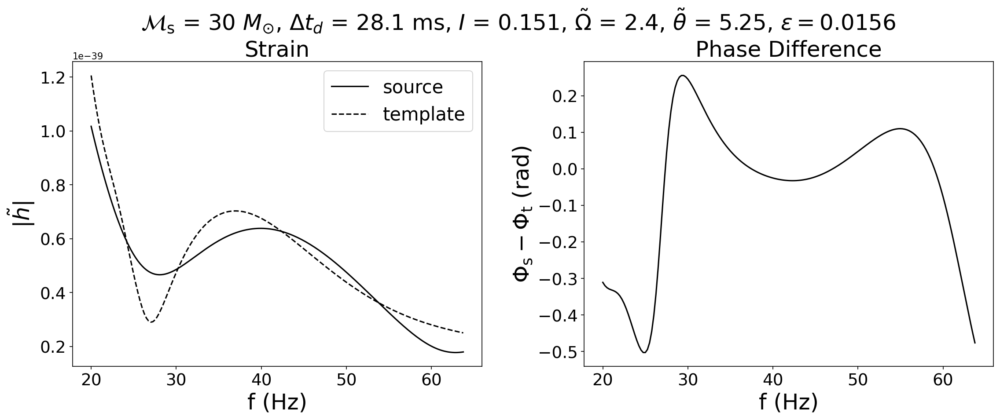

idx = -1.05331e-08, phi = 1.15937e-08, both should be ~0 if get_updated_mismatch_results is True


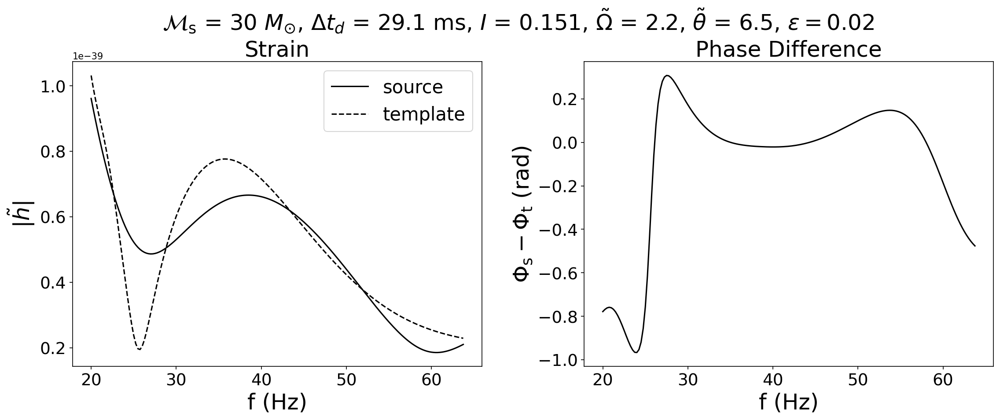

idx = 1.30176e-08, phi = -3.14448e-08, both should be ~0 if get_updated_mismatch_results is True


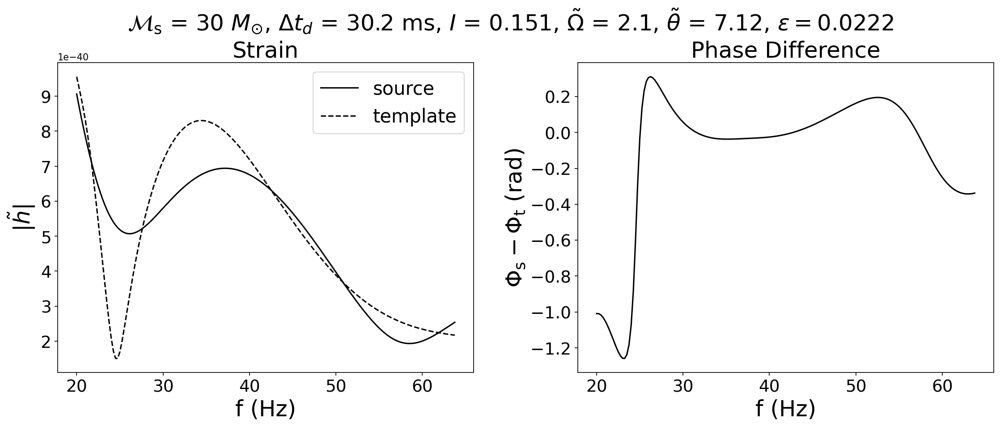

idx = -2.4538e-08, phi = 3.83404e-08, both should be ~0 if get_updated_mismatch_results is True


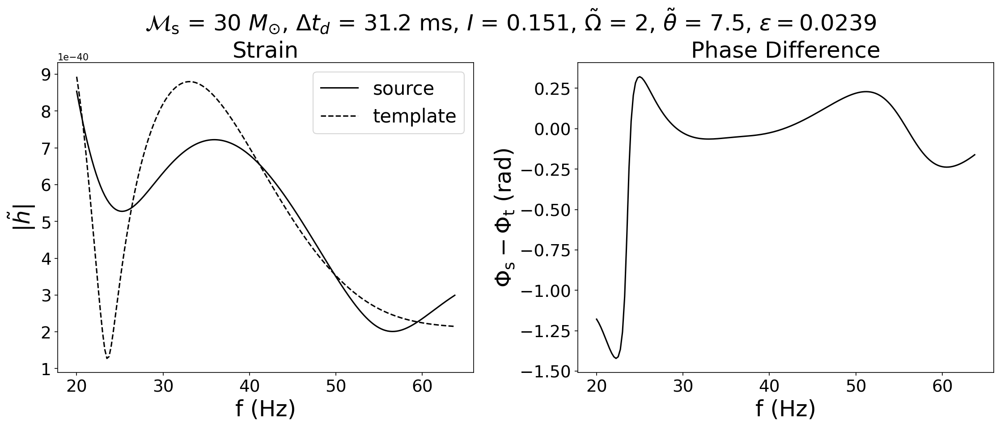

In [25]:
y = get_y_from_I(I)
lens_params_2 = data_td["source_params"]
RP_params_2 = copy.deepcopy(RP_params_1)
RP_params_2["mcz"] = lens_params_2["mcz"]
lens_params_2["y"] = y

MLz_arr = get_MLz_from_td(td_arr, y)

for i in range(0, len(MLz_arr), 2):
    lens_params, RP_params = set_to_params(lens_params_2, RP_params_2)
    lens_params["MLz"] = MLz_arr[i] * solar_mass
    RP_params["omega_tilde"] = data_td[td_arr[i]]["stats"]["ep_min_omega_tilde"]
    RP_params["theta_tilde"] = data_td[td_arr[i]]["stats"]["ep_min_theta_tilde"]
    RP_params["gamma_P"] = data_td[td_arr[i]]["stats"]["ep_min_gammaP"]

    plot_waveform_comparison(RP_params, lens_params, get_updated_mismatch_results=True)
    plt.show()

In [ ]:
lens_params_2 = data_I["source_params"]
RP_params_2 = copy.deepcopy(RP_params_1)
RP_params_2["mcz"] = lens_params_2["mcz"]

y_arr = data_I["y_arr"]
MLz_arr = data_I["MLz_arr"]
I_arr = data_I["I_arr"]

for i in range(0, len(y_arr), 20):
    lens_params, RP_params = set_to_params(lens_params_2, RP_params_2)
    lens_params["y"] = y_arr[i]
    lens_params["MLz"] = MLz_arr[i] * solar_mass
    RP_params["omega_tilde"] = data_I[I_arr[i]]["stats"]["ep_min_omega_tilde"]
    RP_params["theta_tilde"] = data_I[I_arr[i]]["stats"]["ep_min_theta_tilde"]
    RP_params["gamma_P"] = data_I[I_arr[i]]["stats"]["ep_min_gammaP"]

    plot_waveform_comparison(RP_params, lens_params, get_updated_mismatch_results=True)
    plt.show()